# MONET-analysis dev 

First lets just import the driver to see how it happens and so we can play around with it a little 

In [1]:
import driver

/home/rschwantes/anaconda3/envs/py36_monet_default/lib/python3.6/site-packages/pyresample/bilinear/__init__.py:50: UserWarning: XArray and/or zarr not found, XArrayBilinearResampler won't be available.
  warnings.warn("XArray and/or zarr not found, XArrayBilinearResampler won't be available.")


Please install h5py to open files from the Amazon S3 servers.
Please install h5netcdf to open files from the Amazon S3 servers.


### Driver class

Now lets create an instance of the python driver analysis class. It consists of 4 main parts; model instances, observation instances, a paired instance of both.  This will allow us to move things around the plotting function for spatial and overlays and more complex plots.

In [2]:
an = driver.analysis()

### Control File

set the yaml control file and begin by reading the file

In [3]:
an.control = 'control_cmaq.yaml'
an.read_control() # control='control.yaml')
an.control_dict

{'analysis': {'start_time': '2019-08-02-12:00:00',
  'end_time': '2019-08-03-12:00:00',
  'output_dir': '/home/rschwantes/MONET/processed_plots/Aug_2021/0802/'},
 'model': {'cmaq_expt': {'files': '/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.conc.ncf',
   'files_vert': '/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.metcro3d.ncf',
   'files_surf': '/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.metcro2d.ncf',
   'mod_type': 'cmaq',
   'radius_of_influence': 18000,
   'mapping': {'airnow': {'CO': 'CO',
     'NO2': 'NO2',
     'NO': 'NO',
     'O3': 'OZONE'}},
   'projection': 'None',
   'plot_kwargs': {'color': 'magenta', 'marker': 'o', 'linestyle': '--'}},
  'rrfs_13km': {'files': '/wrk/d2/rschwantes/MONET_test/RRFS_CMAQ/r131_v1/0802/dynf*.nc',
   'mod_type': 'rrfs',
   'mod_kwargs': {'mech': 'cb6r3_ae6_aq'},
   'radius_of_influence': 19500,
   'mapping': {'airnow': {'co': 'CO',
     'no2': 'NO2',


### Loading the model data 

driver will automatically loop through the "models" found in the model section of the yaml file and create an instance of the driver.model class for each that includes the label, mapping information, and xarray object as well as the filenames.  Note it can open multiple files easily by including hot keys 

In [4]:
an.open_models()

cmaq_expt
{'files': '/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.conc.ncf', 'files_vert': '/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.metcro3d.ncf', 'files_surf': '/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.metcro2d.ncf', 'mod_type': 'cmaq', 'radius_of_influence': 18000, 'mapping': {'airnow': {'CO': 'CO', 'NO2': 'NO2', 'NO': 'NO', 'O3': 'OZONE'}}, 'projection': 'None', 'plot_kwargs': {'color': 'magenta', 'marker': 'o', 'linestyle': '--'}}
/wrk/d2/rschwantes/MONET_test/CMAQ_EXPT/fv3-cmaq-gbbpex1_full/0802/aqm.t12z.conc.ncf
[########################################] | 100% Completed |  0.8s
[########################################] | 100% Completed |  0.9s
[########################################] | 100% Completed |  0.9s
[########################################] | 100% Completed |  1.0s
[########################################] | 100% Completed |  0.1s
[#################################

In [5]:
an.models

{'cmaq_expt': <driver.model at 0x7faeb7ebc198>,
 'rrfs_13km': <driver.model at 0x7faea6d4c9e8>,
 'wrfchem_v4.2': <driver.model at 0x7faea6c990f0>}

In [6]:
an.models['cmaq_expt'].obj

<xarray.Dataset>
Dimensions:         (time: 73, x: 442, y: 265, z: 35)
Coordinates:
  * time            (time) datetime64[ns] 2019-08-02T12:00:00 ... 2019-08-05T...
    longitude       (y, x) float64 -120.6 -120.5 -120.4 ... -58.98 -58.83 -58.69
    latitude        (y, x) float64 21.89 21.92 21.95 21.97 ... 47.88 47.84 47.79
Dimensions without coordinates: x, y, z
Data variables:
    O3              (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    CO              (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    SO2             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    NO              (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    NO2             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    NO3             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    N2O5            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    HONO            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    HNO3            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    PAN             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    PANX            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    PNA             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    NTR             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    CRON            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    CRNO            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    CRN2            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    CRPX            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    OPAN            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    PAR             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ETH             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ETOH            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    OLE             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    TOL             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    FORM            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    XYL             (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ALD2            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ISOP            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ETHA            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    IOLE            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ALDX            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    TERP            (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    AXYL1J          (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    AXYL2J          (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    AXYL3J          (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ATOL1J          (time, z, y, x) float32 dask.array<chunksize=(73, 35, 265, 442), meta=np.ndarray>
    ATOL2J          (time, z, y, x) float32 das

In [9]:
an.models['rrfs_13km'].obj

<xarray.Dataset>
Dimensions:         (time: 31, x: 393, y: 225, z: 64)
Coordinates:
    longitude       (y, x) float64 dask.array<chunksize=(225, 393), meta=np.ndarray>
    latitude        (y, x) float64 dask.array<chunksize=(225, 393), meta=np.ndarray>
  * time            (time) datetime64[ns] 2019-08-02T12:03:00 ... 2019-08-03T...
Dimensions without coordinates: x, y, z
Data variables:
    aacd            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aalj            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aalk1j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aalk2j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    abnz1j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    abnz2j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    abnz3j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    acaj            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    acet            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    acli            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aclj            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aclk            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    acors           (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    acro_primary    (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    acrolein        (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aeci            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aecj            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    afej            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aglyj           (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ah2oi           (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ah2oj           (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ah2ok           (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ah3opi          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ah3opj          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ah3opk          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aiso1j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aiso2j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aiso3j          (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aivpo1j         (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    akj             (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ald2            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    ald2_primary    (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    aldx            (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    alvoo1i         (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    alvoo1j         (time, z, y, x) float32 dask.array<chunksize=(1, 64, 225, 393), meta=np.ndarray>
    alvoo2i         (time, z, y, x) float32 dask.array<chunksize=(1, 64, 2

In [10]:
#an.models['rrfs_25km'].obj
#an.models['rrfs_25km'].obj.isel(z=0).expand_dims('z',axis=1)

In [11]:
an.models['wrfchem_v4.2'].obj
#All the info in the model class can be called here.
#print(an.models['cmaq_oper'].label)
#print(an.models['cmaq_oper'].mapping)

<xarray.Dataset>
Dimensions:        (time: 31, x: 440, y: 284, z: 50)
Coordinates:
    longitude      (y, x) float32 -122.3 -122.2 -122.1 ... -60.68 -60.52 -60.37
    latitude       (y, x) float32 21.19 21.22 21.24 21.27 ... 50.28 50.24 50.2
  * time           (time) datetime64[ns] 2019-08-02 ... 2019-08-03T06:00:00
Dimensions without coordinates: x, y, z
Data variables:
    no2            (time, z, y, x) float32 0.01331 0.01339 ... 0.3504 0.3504
    o3             (time, z, y, x) float32 30.0 30.0 ... 2.727e+03 2.727e+03
    co             (time, z, y, x) float32 74.85 74.85 74.91 ... 69.99 69.99
    no             (time, z, y, x) float32 0.003643 0.003673 ... 0.0002108
    pres_pa_mid    (time, z, y, x) float32 1.013e+05 1.013e+05 ... 5.584e+03
    alt_msl_m_mid  (time, z, y, x) float32 11.38 11.38 ... 2.031e+04 2.031e+04
    temperature_k  (time, z, y, x) float32 296.6 296.5 296.4 ... 221.2 221.2
    surfalt_m      (time, y, x) float32 -0.009976 -0.009976 ... 6.051 2.27
    alt_agl_m_mid  (time, z, y, x) float32 11.39 11.39 ... 2.03e+04 2.03e+04
    surfpres_pa    (time, y, x) float32 1.015e+05 1.015e+05 ... 1.009e+05
Attributes:
    TRUELAT1:                  33.0
    TRUELAT2:                  45.0
    MOAD_CEN_LAT:              39.617638
    STAND_LON:                 -97.0
    MAP_PROJ:                  1
    CEN_LAT:                   39.617638
    CEN_LON:                   -97.77487
    proj4_srs:                 +proj=lcc +lat_1=33.0 +lat_2=45.0 +lat_0=39.61...
    mapping_tables_to_airnow:  {'OZONE': 'o3', 'PM2.5': 'PM2_5_DRY', 'PM10': ...

In [12]:
#All the info in the analysis class can also be called.
print(an.start_time)
print(an.end_time)
print(an.download_maps)

2019-08-02 12:00:00
2019-08-03 12:00:00
True


### Open Obs

Now for monet-analysis we will open preprocessed data in either netcdf icartt or some other format.  We will not be retrieving data like monetio does for some observations (ie aeronet, airnow, etc....).  Instead we will provide utitilies to do this so that users can add more data easily.

Like models we list all obs objects in the yaml file and it will loop through and create driver.observation instances that include the model type, file, objects (i.e. data object) and label  

In [51]:
an.open_obs()

In [52]:
#All the info in the observation class can also be called.
an.obs['airnow'].obj

<xarray.Dataset>
Dimensions:     (time: 2163, x: 3790, y: 1)
Coordinates:
  * x           (x) int64 0 1 2 3 4 5 6 7 ... 3783 3784 3785 3786 3787 3788 3789
  * time        (time) datetime64[ns] 2019-08-01 ... 2019-08-31T00:30:00
    latitude    (y, x) float64 ...
    longitude   (y, x) float64 ...
    siteid      (y, x) object ...
Dimensions without coordinates: y
Data variables:
    BARPR       (time, y, x) float64 ...
    BC          (time, y, x) float64 ...
    CO          (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    NO          (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    NO2         (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    NO2Y        (time, y, x) float64 ...
    NOX         (time, y, x) float64 ...
    NOY         (time, y, x) float64 ...
    OZONE       (time, y, x) float64 2.0 30.0 17.0 21.0 nan ... nan nan nan nan
    PM10        (time, y, x) float64 ...
    PM2.5       (time, y, x) float64 nan 8.0 nan nan 12.0 ... nan nan nan nan
    PRECIP      (time, y, x) float64 -0.1 -0.1 -0.1 -0.1 ... -0.1 -0.1 -0.1 -0.1
    RHUM        (time, y, x) float64 ...
    RWD         (time, y, x) float64 ...
    RWS         (time, y, x) float64 ...
    SO2         (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    SRAD        (time, y, x) float64 ...
    TEMP        (time, y, x) float64 -274.2 -274.2 -274.2 ... -274.2 -274.2
    UV-AETH     (time, y, x) float64 ...
    WD          (time, y, x) float64 ...
    WS          (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    site        (y, x) object ...
    utcoffset   (y, x) int64 ...
    units       (y, x) object ...
    cmsa_name   (y, x) float64 ...
    msa_code    (y, x) float64 ...
    msa_name    (y, x) object ...
    state_name  (y, x) object ...
    epa_region  (y, x) object ...
    time_local  (time, y, x) datetime64[ns] ...
Attributes:
    title:         
    format:        NetCDF-4
    date_created:  2021-06-07

In [53]:
#This just pairs the data
an.pair_data()

[########################################] | 100% Completed | 10.1s
[########################################] | 100% Completed | 10.2s
[########################################] | 100% Completed | 10.3s
[########################################] | 100% Completed | 10.4s
[########################################] | 100% Completed | 15.7s
[########################################] | 100% Completed | 15.7s
[########################################] | 100% Completed | 15.8s
[########################################] | 100% Completed | 15.9s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.3s


Reference std: 226.148449507843
Reference std: 8.166414136107182
Reference std: 7.232779425927241
Reference std: 17.606548691411188
[                                        ] | 0% Completed |  0.1s

/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  3.7s
[########################################] | 100% Completed |  3.8s
[########################################] | 100% Completed |  3.9s
[########################################] | 100% Completed |  3.9s
[########################################] | 100% Completed |  0.1s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  2.2s
[########################################] | 100% Completed |  2.3s
[########################################] | 100% Completed |  2.3s
[########################################] | 100% Completed |  2.4s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[                                        ] | 0% Completed |  0.1s

/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  3.4s
[########################################] | 100% Completed |  3.4s
[########################################] | 100% Completed |  3.5s
[########################################] | 100% Completed |  3.6s
[########################################] | 100% Completed |  0.1s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.4s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  2.2s
[########################################] | 100% Completed |  2.2s
[########################################] | 100% Completed |  2.3s
[########################################] | 100% Completed |  2.3s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[                                        ] | 0% Completed |  0.1s

/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  4.3s
[########################################] | 100% Completed |  4.3s
[########################################] | 100% Completed |  4.4s
[########################################] | 100% Completed |  4.5s
[########################################] | 100% Completed |  0.1s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.4s
[########################################] | 100% Completed |  2.0s
[########################################] | 100% Completed |  2.0s
[########################################] | 100% Completed |  2.2s
[########################################] | 100% Completed |  2.3s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[                                        ] | 0% Completed |  0.1s

/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  2.9s
[########################################] | 100% Completed |  3.0s
[########################################] | 100% Completed |  3.1s
[########################################] | 100% Completed |  3.2s
[########################################] | 100% Completed |  0.1s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})


[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.2s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.4s
[########################################] | 100% Completed |  1.9s
[########################################] | 100% Completed |  2.0s
[########################################] | 100% Completed |  2.1s
[########################################] | 100% Completed |  2.1s


/home/rschwantes/MONET/monet/monet/plots/mapgen.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(figsize=figsize, subplot_kw={"projection": crs})
/home/rschwantes/MONET/MONET-analysis/melodies_monet/plots/surfplots.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f,ax = plt.subplots(**fig_dict)
/home/rschwantes/MONET/MONET-analysis/melodies_monet/plots/surfplots.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until

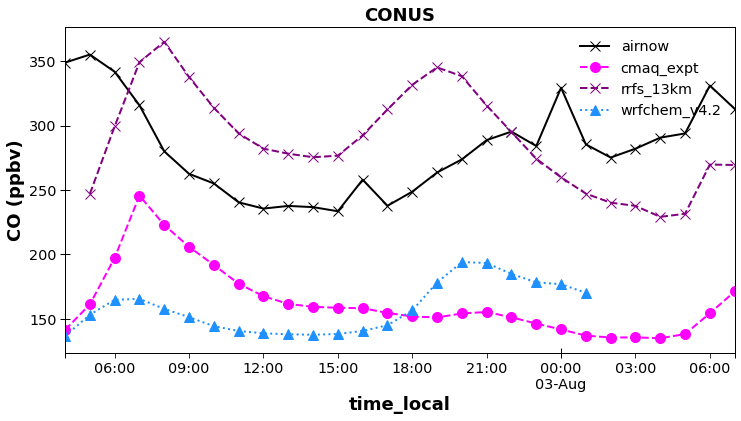

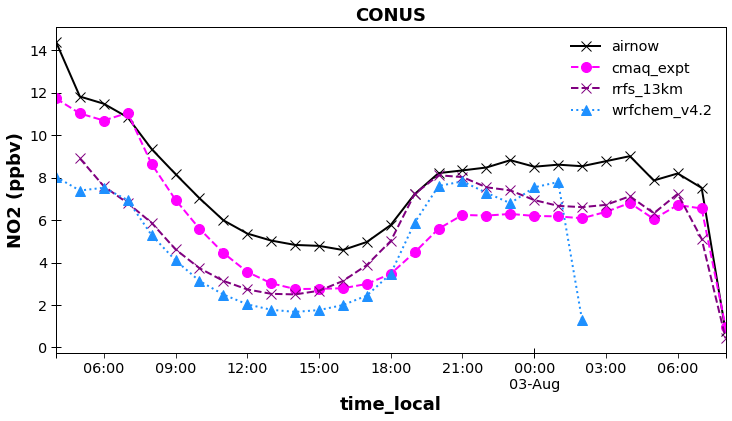

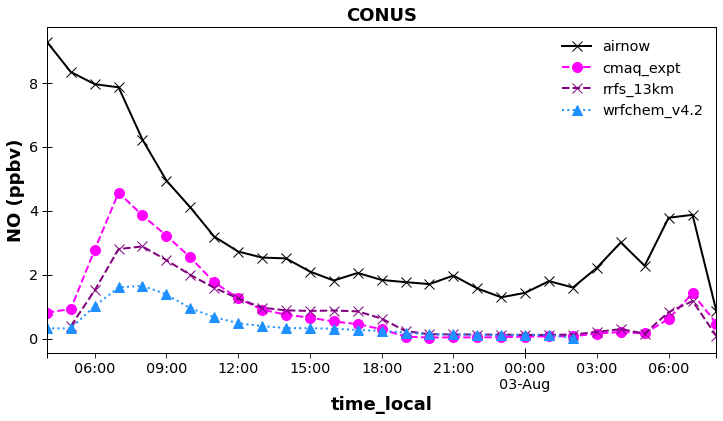

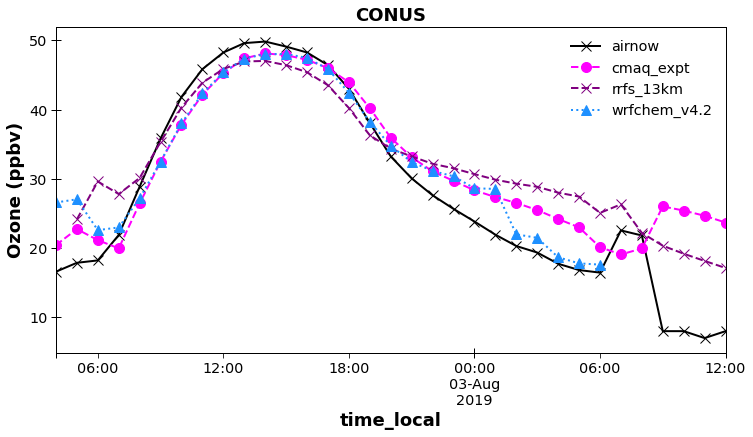

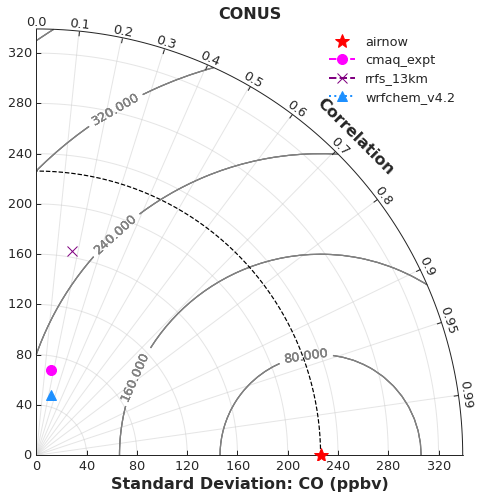

...

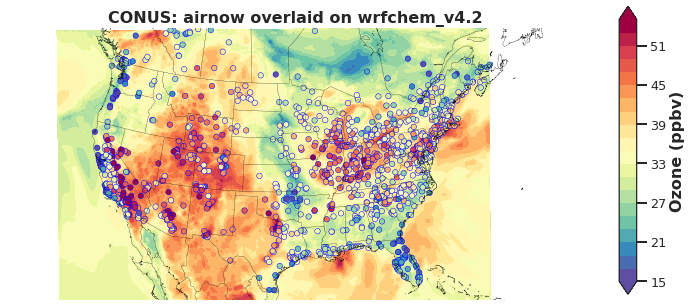

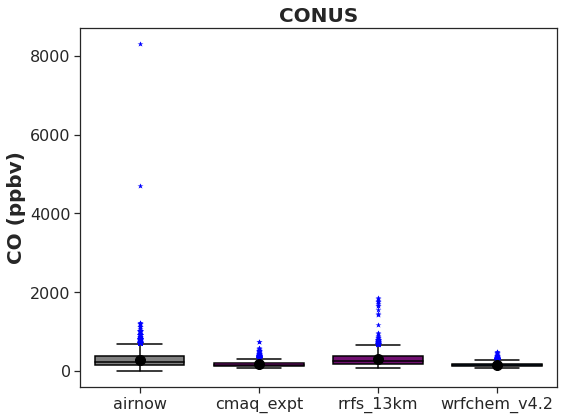

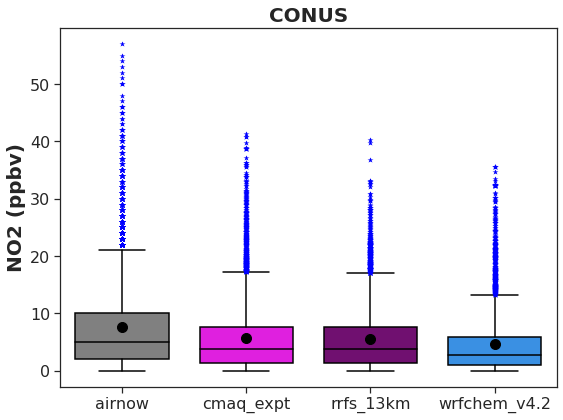

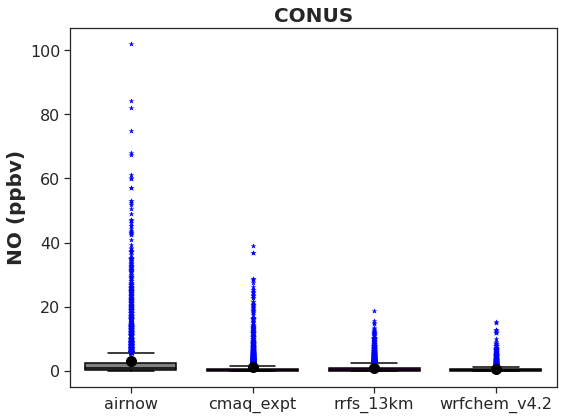

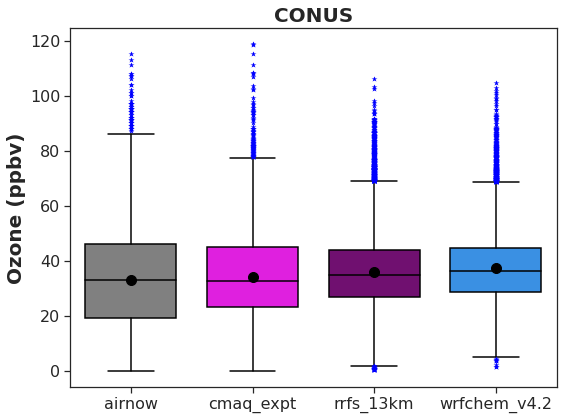

In [54]:
#And this generates all the plots.
an.plotting()

In [55]:
an.stats()

In [13]:
import monet 
import monetio 
import numpy as np

#Open the file
firex_data = '/wrk/d2/rschwantes/MONET_test/FIREX/merge_1s/firexaq-mrg01-dc8_merge_20190802_RL.ict'
ds=monetio.icartt.add_data(firex_data)

In [14]:
# rename latitude, longitude, and altitude
#Convert pressure into pa so similar to the model
df = ds.rename({'Latitude_YANG':'latitude',
                'Longitude_YANG':'longitude',
                'P_BUI':'pressure_obs'}).to_dataframe() #'time':'time_obs'

#Fill LLOD with 0 and ULOD with NaN and convert pressure units just once 
df['pressure_obs'] = df['pressure_obs']*100
df = df.replace(-777777,np.NaN)
df = df.replace(-888888,0.0)

#Resample the data
df = df.resample('60S').mean()

In [15]:
df_obs = df[['latitude','longitude','pressure_obs','O3_CL_RYERSON','NO_CL_RYERSON',
            'NO2_CL_RYERSON','CO_LGR_ppb_PEISCHL']]

In [16]:
# do the facy trick to convert to get something useful for MONET
# this converts to dimensions of x and y
# you may want to make pressure / msl a coordinate too
new_ds = df.rename_axis('time_obs').reset_index().monet._df_to_da().set_coords(['time_obs','pressure_obs'])


In [17]:
new_ds

<xarray.Dataset>
Dimensions:                                       (x: 365, y: 1)
Coordinates:
  * x                                             (x) int64 0 1 2 ... 363 364
    time_obs                                      (y, x) datetime64[ns] 2019-...
    latitude                                      (y, x) float64 43.57 ... 43.55
    longitude                                     (y, x) float64 -116.2 ... -...
    pressure_obs                                  (y, x) float64 9.045e+04 .....
Dimensions without coordinates: y
Data variables:
    Time_Stop                                     (y, x) float64 7.613e+04 .....
    Day_Of_Year_YANG                              (y, x) float64 214.0 ... 214.0
    MSL_GPS_Altitude_YANG                         (y, x) float64 940.9 ... 998.7
    HAE_GPS_Altitude_YANG                         (y, x) float64 921.5 ... 975.9
    Pressure_Altitude_YANG                        (y, x) float64 2.962e+03 .....
    Radar_Altitude_YANG                           (y, x) float64 231.4 ... 371.5
    Ground_Speed_YANG                             (y, x) float64 87.84 ... 81.89
    True_Air_Speed_YANG                           (y, x) float64 178.8 ... 164.0
    Indicated_Air_Speed_YANG                      (y, x) float64 165.0 ... 150.1
    Mach_Number_YANG                              (y, x) float64 0.2636 ... 0...
    Vertical_Speed_YANG                           (y, x) float64 9.6 ... -6.072
    True_Heading_YANG                             (y, x) float64 294.8 ... 297.4
    Track_Angle_YANG                              (y, x) float64 295.0 ... 295.2
    Drift_Angle_YANG                              (y, x) float64 0.1316 ... -...
    Pitch_Angle_YANG                              (y, x) float64 12.16 ... -3...
    Roll_Angle_YANG                               (y, x) float64 -0.1321 ... ...
    Static_Air_Temp_YANG                          (y, x) float64 30.19 ... 31.76
    Potential_Temp_YANG                           (y, x) float64 311.7 ... 314.1
    Dew_Point_YANG                                (y, x) float64 10.2 ... 5.591
    Total_Air_Temp_YANG                           (y, x) float64 34.41 ... 35.34
    IR_Surf_Temp_YANG                             (y, x) float64 34.8 ... 16.76
    Static_Pressure_YANG                          (y, x) float64 909.4 ... 901.3
    Cabin_Pressure_YANG                           (y, x) float64 926.2 ... 927.2
    Wind_Speed_YANG                               (y, x) float64 4.332 ... 4.798
    Wind_Direction_YANG                           (y, x) float64 288.2 ... 299.7
    Solar_Zenith_Angle_YANG                       (y, x) float64 30.5 ... 91.66
    Aircraft_Sun_Elevation_YANG                   (y, x) float64 54.61 ... 1.188
    Sun_Azimuth_YANG                              (y, x) float64 37.91 ... 296.4
    Aircraft_Sun_Azimuth_YANG                     (y, x) float64 -59.05 ... -...
    Mixing_Ratio_YANG                             (y, x) float64 8.724 ... 6.42
    Part_Press_Water_Vapor_YANG                   (y, x) float64 12.58 ... 9.216
    Sat_Vapor_Press_H2O_YANG                      (y, x) float64 43.33 ... 47.39
    Sat_Vapor_Press_Ice_YANG                      (y, x) float64 57.88 ... 64.23
    Relative_Humidity_YANG                        (y, x) float64 29.07 ... 19.42
    T_BUI                                         (y, x) float64 303.0 ... 305.1
    TAS_BUI                                       (y, x) float64 90.72 ... 83.87
    U_BUI                                         (y, x) float64 2.323 ... -0...
    V_BUI                                         (y, x) float64 -1.854 ... -...
    W_BUI                                         (y, x) float64 0.6352 ... 1...
    TEDR_BUI                                      (y, x) float64 -6.707 ... -...
    REYN_BUI                                      (y, x) float64 5.238 ... 5.374
    POT_BUI                                       (y, x) float64 311.8 ... 314.3
    ROLL_BUI                                      (y, x)

In [18]:
df['pressure_obs']

time
2019-08-02 21:08:00    90452.279167
2019-08-02 21:09:00    88076.431833
2019-08-02 21:10:00    84529.155500
2019-08-02 21:11:00    79674.024500
2019-08-02 21:12:00    74668.635667
                           ...     
2019-08-03 03:08:00    72590.936667
2019-08-03 03:09:00    74666.793333
2019-08-03 03:10:00    79009.156667
2019-08-03 03:11:00    84542.710000
2019-08-03 03:12:00    90199.275439
Freq: 60S, Name: pressure_obs, Length: 365, dtype: float64

In [19]:
#Nearest neighbor approach to find closest grid cell to each point.
ds_wrf = monet.util.combinetool.combine_da_to_da(an.models['wrfchem_v4.2'].obj,new_ds,merge=False)
ds_wrf = ds_wrf.interp(time=ds_wrf.time_obs.squeeze())
ds_wrf

<xarray.Dataset>
Dimensions:        (x: 365, y: 1, z: 50)
Coordinates:
    longitude      (y, x) float64 -116.2 -116.3 -116.3 ... -116.2 -116.1 -116.2
    pressure_obs   (y, x) float64 9.045e+04 8.808e+04 ... 8.454e+04 9.02e+04
    latitude       (y, x) float64 43.57 43.59 43.64 43.71 ... 43.6 43.55 43.55
    time           (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T03:1...
  * x              (x) int64 0 1 2 3 4 5 6 7 ... 357 358 359 360 361 362 363 364
    time_obs       (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T03:1...
Dimensions without coordinates: y, z
Data variables:
    no2            (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    o3             (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    co             (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    no             (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    pres_pa_mid    (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    alt_msl_m_mid  (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    temperature_k  (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    surfalt_m      (x, y) float32 dask.array<chunksize=(365, 1), meta=np.ndarray>
    alt_agl_m_mid  (x, z, y) float32 dask.array<chunksize=(365, 50, 1), meta=np.ndarray>
    surfpres_pa    (x, y) float32 dask.array<chunksize=(365, 1), meta=np.ndarray>
Attributes:
    TRUELAT1:                  33.0
    TRUELAT2:                  45.0
    MOAD_CEN_LAT:              39.617638
    STAND_LON:                 -97.0
    MAP_PROJ:                  1
    CEN_LAT:                   39.617638
    CEN_LON:                   -97.77487
    proj4_srs:                 +proj=lcc +lat_1=33.0 +lat_2=45.0 +lat_0=39.61...
    mapping_tables_to_airnow:  {'OZONE': 'o3', 'PM2.5': 'PM2_5_DRY', 'PM10': ...

In [20]:
ds_cmaq = monet.util.combinetool.combine_da_to_da(an.models['cmaq_expt'].obj,new_ds,merge=False)
ds_cmaq = ds_cmaq.interp(time=ds_cmaq.time_obs.squeeze())
ds_cmaq

<xarray.Dataset>
Dimensions:         (x: 365, y: 1, z: 35)
Coordinates:
    longitude       (y, x) float64 -116.2 -116.3 -116.3 ... -116.2 -116.1 -116.2
    pressure_obs    (y, x) float64 9.045e+04 8.808e+04 ... 8.454e+04 9.02e+04
    latitude        (y, x) float64 43.57 43.59 43.64 43.71 ... 43.6 43.55 43.55
    time            (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T03:...
  * x               (x) int64 0 1 2 3 4 5 6 7 ... 358 359 360 361 362 363 364
    time_obs        (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T03:...
Dimensions without coordinates: y, z
Data variables:
    O3              (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    CO              (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    SO2             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    NO              (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    NO2             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    NO3             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    N2O5            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    HONO            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    HNO3            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    PAN             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    PANX            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    PNA             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    NTR             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    CRON            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    CRNO            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    CRN2            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    CRPX            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    OPAN            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    PAR             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ETH             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ETOH            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    OLE             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    TOL             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    FORM            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    XYL             (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ALD2            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ISOP            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ETHA            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    IOLE            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ALDX            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    TERP            (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    AXYL1J          (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    AXYL2J          (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    AXYL3J          (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ATOL1J          (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ATOL2J          (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ATOL3J          (x, z, y) float32 dask.array<chunksize=(365, 35, 1), meta=np.ndarray>
    ABNZ1J          (x, z, y) float32 dask.array<chunksize=(365, 3

In [22]:
ds_rrfs = monet.util.combinetool.combine_da_to_da(an.models['rrfs_13km'].obj,new_ds,merge=False)
ds_rrfs = ds_rrfs.interp(time=ds_rrfs.time_obs.squeeze())
ds_rrfs

<xarray.Dataset>
Dimensions:         (x: 365, y: 1, z: 64)
Coordinates:
    longitude       (y, x) float64 -116.2 -116.3 -116.3 ... -116.2 -116.1 -116.2
    pressure_obs    (y, x) float64 9.045e+04 8.808e+04 ... 8.454e+04 9.02e+04
    latitude        (y, x) float64 43.57 43.59 43.64 43.71 ... 43.6 43.55 43.55
    time            (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T03:...
  * x               (x) int64 0 1 2 3 4 5 6 7 ... 358 359 360 361 362 363 364
    time_obs        (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T03:...
Dimensions without coordinates: y, z
Data variables:
    aacd            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aalj            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aalk1j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aalk2j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    abnz1j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    abnz2j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    abnz3j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    acaj            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    acet            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    acli            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aclj            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aclk            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    acors           (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    acro_primary    (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    acrolein        (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aeci            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aecj            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    afej            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aglyj           (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ah2oi           (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ah2oj           (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ah2ok           (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ah3opi          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ah3opj          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ah3opk          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aiso1j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aiso2j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aiso3j          (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aivpo1j         (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    akj             (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ald2            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    ald2_primary    (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    aldx            (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    alvoo1i         (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    alvoo1j         (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    alvoo2i         (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    alvoo2j         (x, z, y) float32 dask.array<chunksize=(365, 64, 1), meta=np.ndarray>
    alvpo1i         (x, z, y) float32 dask.array<chunksize=(365, 6

In [23]:
def resample_stratify(da, levels, vertical, axis=1,interpolation='linear',extrapolation='nan'):
    import stratify
    import xarray as xr

    result = stratify.interpolate(levels, vertical.chunk(), da.chunk(), axis=axis,
                                 interpolation = interpolation,extrapolation = extrapolation)
    dims = da.dims
    out = xr.DataArray(result, dims=dims)
    for i in dims:
        if i != "z":
            out[i] = da[i]
    out.attrs = da.attrs.copy()
    if len(da.coords) > 0:
        for i in da.coords:
            if i != "z":
                out.coords[i] = da.coords[i]
    return out

In [24]:
def vert_interp(ds_model,df_obs,var_name_list = ['o3','pres_pa_mid']):
    import xarray as xr
    from pandas import merge_asof, Series
    
    var_out_list = []
    for var_name in var_name_list:
        if var_name == 'pres_pa_mid':
            out = resample_stratify(ds_model[var_name],sorted(ds_model.pressure_obs.squeeze().values,reverse=True),
                                      ds_model['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
            #Use extrapolation nan for the pressure so that later you can assign the nan values to the pressure_obs value 
            #instead of the midpoint of the edge model cells. This is needed for the pairing later on.
        else:
            out = resample_stratify(ds_model[var_name],sorted(ds_model.pressure_obs.squeeze().values,reverse=True),
                                  ds_model['pres_pa_mid'],axis=1,
                                  interpolation='linear',extrapolation='nearest')
        out.name = var_name
        var_out_list.append(out)

    df_model = xr.merge(var_out_list).to_dataframe().reset_index()
    df_model.pres_pa_mid.fillna(df_model.pressure_obs,inplace=True)
    df_model.drop(labels=['x','y','z','pressure_obs','time_obs'], axis=1, inplace=True)
    df_model.rename(columns={'pres_pa_mid':'pressure_obs'}, inplace=True)
    
    final_df_model = merge_asof(df_obs, df_model, 
                            by=['latitude', 'longitude', 'pressure_obs'], 
                            on='time', direction='nearest')

    return final_df_model

In [25]:
ds_wrf['pres_pa_mid'].values.max()

[########################################] | 100% Completed |  5.3s
[########################################] | 100% Completed |  5.4s
[########################################] | 100% Completed |  5.5s
[########################################] | 100% Completed |  5.6s


93251.639453125

In [26]:
var_name_list = ['o3','no','no2','co','pres_pa_mid']
df_wrf = vert_interp(ds_wrf,df_obs,var_name_list)
df_wrf

[########################################] | 100% Completed |  6.6s
[########################################] | 100% Completed |  6.7s
[########################################] | 100% Completed |  6.7s
[########################################] | 100% Completed |  6.8s
[########################################] | 100% Completed |  5.7s
[########################################] | 100% Completed |  5.7s
[########################################] | 100% Completed |  5.8s
[########################################] | 100% Completed |  5.9s
[########################################] | 100% Completed |  5.6s
[########################################] | 100% Completed |  5.7s
[########################################] | 100% Completed |  5.8s
[########################################] | 100% Completed |  5.9s
[########################################] | 100% Completed |  6.2s
[########################################] | 100% Completed |  6.3s
[########################################] | 100

,latitude,longitude,pressure_obs,time,O3_CL_RYERSON,NO_CL_RYERSON,NO2_CL_RYERSON,CO_LGR_ppb_PEISCHL,o3,no,no2,co
0,43.570557,-116.237978,90452.279167,2019-08-02 21:08:00,NaN,NaN,NaN,132.394737,52.046851,0.222317,1.070445,128.286265
1,43.588031,-116.273952,88076.431833,2019-08-02 21:09:00,62.492288,NaN,NaN,126.738333,47.953423,0.148086,0.613183,121.928000
2,43.642376,-116.303628,84529.155500,2019-08-02 21:10:00,60.832333,NaN,NaN,114.394167,49.323137,0.167848,0.611565,122.444473
3,43.712876,-116.319230,79674.024500,2019-08-02 21:11:00,58.875717,NaN,NaN,99.296667,47.354735,0.092713,0.290107,113.758488
4,43.786868,-116.293647,74668.635667,2019-08-02 21:12:00,55.750533,NaN,-0.399262,89.304167,47.711056,0.014281,0.037558,100.653119
...,...,...,...,...,...,...,...,...,...,...,...,...
360,43.728783,-116.204014,72590.936667,2019-08-03 03:08:00,51.686183,NaN,0.081789,100.526667,44.588134,0.001167,0.050694,100.157334
361,43.654894,-116.198748,74666.793333,2019-08-03 03:09:00,51.361133,NaN,0.091027,100.601667,44.751044,0.001339,0.066383,100.871190
362,43.596850,-116.166870,79009.156667,2019-08-03 03:10:00,51.335517,NaN,0.109205,102.236667,45.037061,0.001892,0.121408,103.342467
363,43.554578,-116.137534,84542.710000,2019-08-03 03:11:00,53.996367,NaN,0.170650,102.486667,45.169938,0.003930,0.357058,109.965052


In [27]:
var_name_list = ['O3','NO','NO2','CO','pres_pa_mid']
df_cmaq = vert_interp(ds_cmaq,df_obs,var_name_list)
df_cmaq

[########################################] | 100% Completed | 11.0s
[########################################] | 100% Completed | 11.1s
[########################################] | 100% Completed | 11.2s
[########################################] | 100% Completed | 11.3s
[########################################] | 100% Completed | 18.4s
[########################################] | 100% Completed | 18.5s
[########################################] | 100% Completed | 18.5s
[########################################] | 100% Completed | 18.6s
[########################################] | 100% Completed | 12.1s
[########################################] | 100% Completed | 12.2s
[########################################] | 100% Completed | 12.3s
[########################################] | 100% Completed | 12.4s
[########################################] | 100% Completed | 17.5s
[########################################] | 100% Completed | 17.6s
[########################################] | 100

,latitude,longitude,pressure_obs,time,O3_CL_RYERSON,NO_CL_RYERSON,NO2_CL_RYERSON,CO_LGR_ppb_PEISCHL,O3,NO,NO2,CO
0,43.570557,-116.237978,90452.279167,2019-08-02 21:08:00,NaN,NaN,NaN,132.394737,51.174695,1.328028e-01,0.648893,104.268254
1,43.588031,-116.273952,88076.431833,2019-08-02 21:09:00,62.492288,NaN,NaN,126.738333,51.129312,1.201424e-01,0.549085,103.052704
2,43.642376,-116.303628,84529.155500,2019-08-02 21:10:00,60.832333,NaN,NaN,114.394167,51.042180,1.150194e-01,0.471003,102.257143
3,43.712876,-116.319230,79674.024500,2019-08-02 21:11:00,58.875717,NaN,NaN,99.296667,54.584999,1.623806e-01,0.587683,109.766653
4,43.786868,-116.293647,74668.635667,2019-08-02 21:12:00,55.750533,NaN,-0.399262,89.304167,54.054004,7.535175e-02,0.229962,102.192221
...,...,...,...,...,...,...,...,...,...,...,...,...
360,43.728783,-116.204014,72590.936667,2019-08-03 03:08:00,51.686183,NaN,0.081789,100.526667,45.318232,2.879974e-08,0.119569,87.374189
361,43.654894,-116.198748,74666.793333,2019-08-03 03:09:00,51.361133,NaN,0.091027,100.601667,45.211215,6.693308e-08,0.196003,88.712546
362,43.596850,-116.166870,79009.156667,2019-08-03 03:10:00,51.335517,NaN,0.109205,102.236667,45.005100,7.636831e-08,0.222703,88.961125
363,43.554578,-116.137534,84542.710000,2019-08-03 03:11:00,53.996367,NaN,0.170650,102.486667,44.744018,7.174661e-07,0.672245,94.474189


In [28]:
var_name_list = ['o3','no','no2','co','pres_pa_mid']
df_rrfs = vert_interp(ds_rrfs,df_obs,var_name_list)
df_rrfs

[########################################] | 100% Completed |  5.0s
[########################################] | 100% Completed |  5.1s
[########################################] | 100% Completed |  5.2s
[########################################] | 100% Completed |  5.3s
[########################################] | 100% Completed |  2.2s
[########################################] | 100% Completed |  2.3s
[########################################] | 100% Completed |  2.4s
[########################################] | 100% Completed |  2.5s
[########################################] | 100% Completed |  5.6s
[########################################] | 100% Completed |  5.7s
[########################################] | 100% Completed |  5.7s
[########################################] | 100% Completed |  5.8s
[########################################] | 100% Completed |  2.0s
[########################################] | 100% Completed |  2.1s
[########################################] | 100

,latitude,longitude,pressure_obs,time,O3_CL_RYERSON,NO_CL_RYERSON,NO2_CL_RYERSON,CO_LGR_ppb_PEISCHL,o3,no,no2,co
0,43.570557,-116.237978,90452.279167,2019-08-02 21:08:00,NaN,NaN,NaN,132.394737,53.956699,1.605114e-01,0.631120,158.762238
1,43.588031,-116.273952,88076.431833,2019-08-02 21:09:00,62.492288,NaN,NaN,126.738333,53.774529,1.542662e-01,0.559009,155.943924
2,43.642376,-116.303628,84529.155500,2019-08-02 21:10:00,60.832333,NaN,NaN,114.394167,57.403936,1.712119e-01,0.585440,169.545360
3,43.712876,-116.319230,79674.024500,2019-08-02 21:11:00,58.875717,NaN,NaN,99.296667,54.408243,9.416191e-02,0.274655,140.262873
4,43.786868,-116.293647,74668.635667,2019-08-02 21:12:00,55.750533,NaN,-0.399262,89.304167,49.633950,6.871933e-02,0.170713,122.423477
...,...,...,...,...,...,...,...,...,...,...,...,...
360,43.728783,-116.204014,72590.936667,2019-08-03 03:08:00,51.686183,NaN,0.081789,100.526667,42.293035,7.260155e-09,0.039308,96.353397
361,43.654894,-116.198748,74666.793333,2019-08-03 03:09:00,51.361133,NaN,0.091027,100.601667,41.820304,6.992166e-09,0.039331,96.461766
362,43.596850,-116.166870,79009.156667,2019-08-03 03:10:00,51.335517,NaN,0.109205,102.236667,41.218000,1.788214e-08,0.064916,98.100619
363,43.554578,-116.137534,84542.710000,2019-08-03 03:11:00,53.996367,NaN,0.170650,102.486667,41.757064,1.733481e-07,0.211799,105.493640


In [29]:
df_rrfs['pressure_obs_kpa'] = df_rrfs['pressure_obs']/1000. #Convert to kpa for plotting.
df_wrf['pressure_obs_kpa'] = df_wrf['pressure_obs']/1000. #Convert to kpa for plotting.
df_cmaq['pressure_obs_kpa'] = df_cmaq['pressure_obs']/1000. #Convert to kpa for plotting.

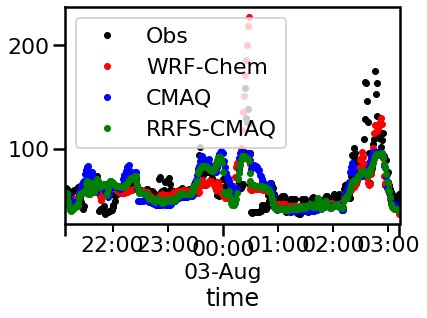

In [30]:
ax = df_wrf.plot(x='time',y='O3_CL_RYERSON',marker='.',color='black',linewidth=0,label='Obs')
ax = df_wrf.plot(x='time',y='o3',marker='.',color='red',linewidth=0,label='WRF-Chem',ax=ax)
ax = df_cmaq.plot(x='time',y='O3',marker='.',color='blue',linewidth=0,label='CMAQ',ax=ax)
ax = df_rrfs.plot(x='time',y='o3',marker='.',color='green',linewidth=0,label='RRFS-CMAQ',ax=ax)

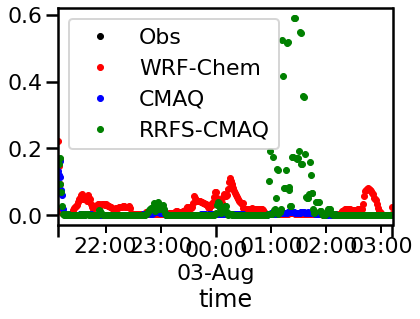

In [31]:
ax = df_wrf.plot(x='time',y='NO_CL_RYERSON',marker='.',color='black',linewidth=0,label='Obs')
ax = df_wrf.plot(x='time',y='no',marker='.',color='red',linewidth=0,label='WRF-Chem',ax=ax)
ax = df_cmaq.plot(x='time',y='NO',marker='.',color='blue',linewidth=0,label='CMAQ',ax=ax)
ax = df_rrfs.plot(x='time',y='no',marker='.',color='green',linewidth=0,label='RRFS-CMAQ',ax=ax)
#This is all NAN so not very useful for the obs. Need to pick a diffent day. Or maybe switch to LIF instrument.
#NO_LIF_ROLLINS,  pptv

(0.0, 1.0)

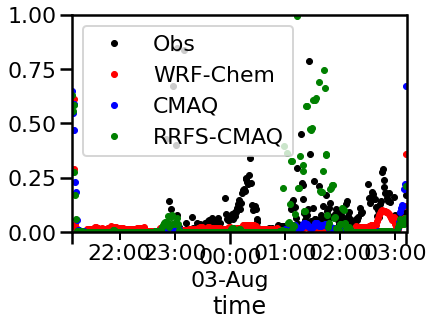

In [32]:
ax = df_wrf.plot(x='time',y='NO2_CL_RYERSON',marker='.',color='black',linewidth=0,label='Obs')
ax = df_wrf.plot(x='time',y='no2',marker='.',color='red',linewidth=0,label='WRF-Chem',ax=ax)
ax = df_cmaq.plot(x='time',y='NO2',marker='.',color='blue',linewidth=0,label='CMAQ',ax=ax)
ax = df_rrfs.plot(x='time',y='no2',marker='.',color='green',linewidth=0,label='RRFS-CMAQ',ax=ax)
ax.set_ylim([0,1])

(0.0, 200.0)

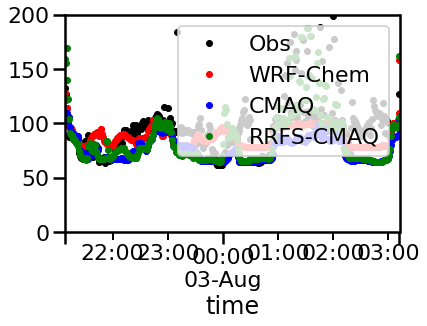

In [33]:
ax = df_wrf.plot(x='time',y='CO_LGR_ppb_PEISCHL',marker='.',color='black',linewidth=0,label='Obs')
ax = df_wrf.plot(x='time',y='co',marker='.',color='red',linewidth=0,label='WRF-Chem',ax=ax)
ax = df_cmaq.plot(x='time',y='CO',marker='.',color='blue',linewidth=0,label='CMAQ',ax=ax)
ax = df_rrfs.plot(x='time',y='co',marker='.',color='green',linewidth=0,label='RRFS-CMAQ',ax=ax)
ax.set_ylim([0,200])

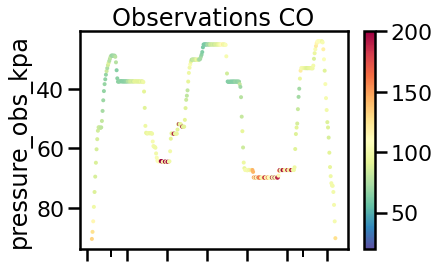

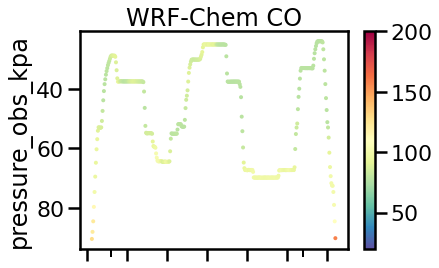

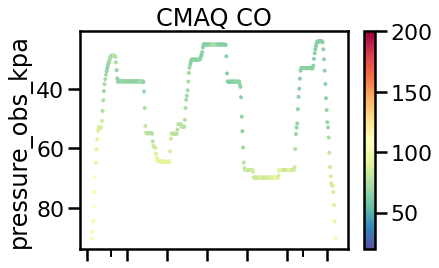

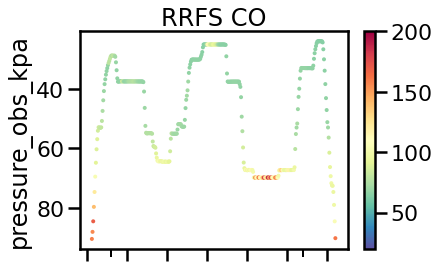

In [34]:
df_wrf.plot.scatter(x='time',y='pressure_obs_kpa',c=df_wrf['CO_LGR_ppb_PEISCHL'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='Observations CO',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()
df_wrf.plot.scatter(x='time',y='pressure_obs_kpa',c=df_wrf['co'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='WRF-Chem CO',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()
df_cmaq.plot.scatter(x='time',y='pressure_obs_kpa',c=df_cmaq['CO'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='CMAQ CO',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()
df_rrfs.plot.scatter(x='time',y='pressure_obs_kpa',c=df_rrfs['co'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='RRFS CO',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()

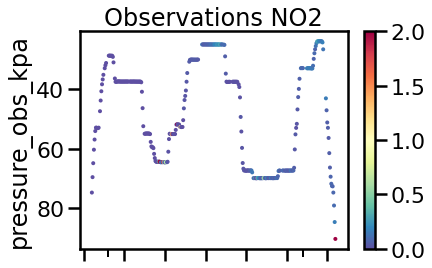

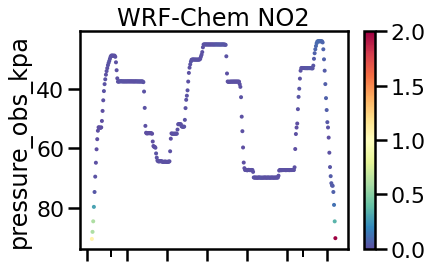

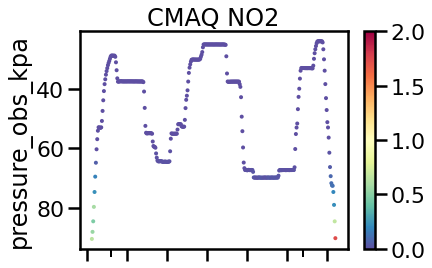

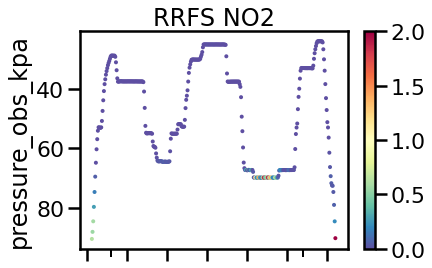

In [35]:
df_wrf.plot.scatter(x='time',y='pressure_obs_kpa',c=df_wrf['NO2_CL_RYERSON'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='Observations NO2',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 0, vmax = 2).invert_yaxis()
df_wrf.plot.scatter(x='time',y='pressure_obs_kpa',c=df_wrf['no2'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='WRF-Chem NO2',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 0, vmax = 2).invert_yaxis()
df_cmaq.plot.scatter(x='time',y='pressure_obs_kpa',c=df_cmaq['NO2'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='CMAQ NO2',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 0, vmax = 2).invert_yaxis()
df_rrfs.plot.scatter(x='time',y='pressure_obs_kpa',c=df_rrfs['no2'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='RRFS NO2',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 0, vmax = 2).invert_yaxis()

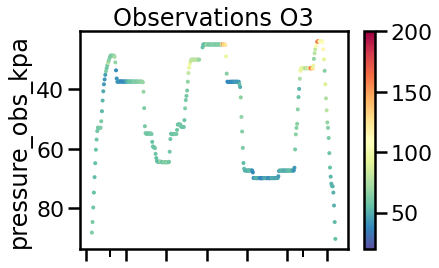

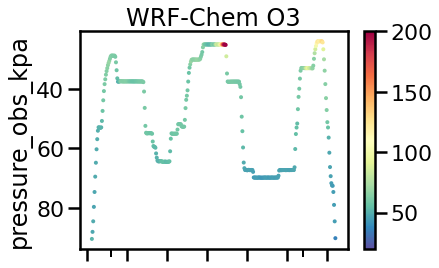

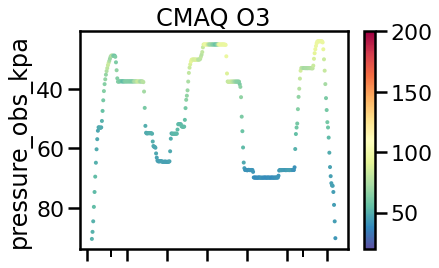

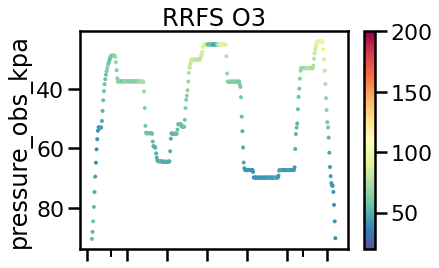

In [36]:
df_wrf.plot.scatter(x='time',y='pressure_obs_kpa',c=df_wrf['O3_CL_RYERSON'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='Observations O3',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()
df_wrf.plot.scatter(x='time',y='pressure_obs_kpa',c=df_wrf['o3'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='WRF-Chem O3',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()
df_cmaq.plot.scatter(x='time',y='pressure_obs_kpa',c=df_cmaq['O3'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='CMAQ O3',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()
df_rrfs.plot.scatter(x='time',y='pressure_obs_kpa',c=df_rrfs['o3'],s=4.0,
                    colorbar=True,colormap='Spectral_r',title='RRFS O3',
                    ylabel='Pressure (pa)',xlabel='time',
                   vmin = 20, vmax = 200).invert_yaxis()

In [37]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_wrf['o3'],target_pressures,
                                      ds_wrf['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'o3'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')
ds_wrf_const

[########################################] | 100% Completed |  5.3s
[########################################] | 100% Completed |  5.4s
[########################################] | 100% Completed |  5.5s
[########################################] | 100% Completed |  5.6s
[########################################] | 100% Completed |  7.7s
[########################################] | 100% Completed |  7.8s
[########################################] | 100% Completed |  7.8s
[########################################] | 100% Completed |  7.9s


<xarray.Dataset>
Dimensions:           (x: 365, y: 1, z: 134)
Coordinates:
    time              (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T0...
    time_obs          (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T0...
  * x                 (x) int64 0 1 2 3 4 5 6 7 ... 358 359 360 361 362 363 364
  * y                 (y) int64 0
    pressure_obs      (y, x) float64 9.045e+04 8.808e+04 ... 8.454e+04 9.02e+04
    latitude          (y, x) float64 43.57 43.59 43.64 ... 43.6 43.55 43.55
    longitude         (y, x) float64 -116.2 -116.3 -116.3 ... -116.1 -116.2
    target_pressures  (z) float64 9.05e+04 9e+04 8.95e+04 ... 2.45e+04 2.4e+04
Dimensions without coordinates: z
Data variables:
    o3                (x, z, y) float64 nan 52.13 52.16 ... 83.36 85.81 88.41

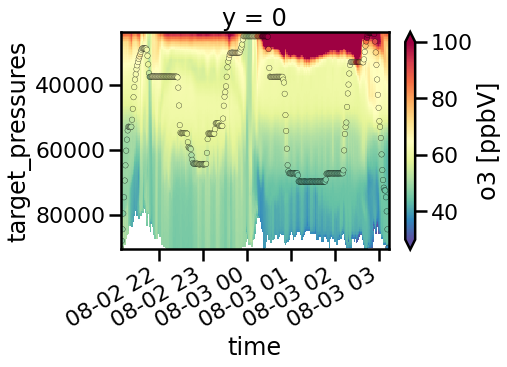

In [38]:
ax = ds_wrf_const['o3'].squeeze().plot(x='time',y='target_pressures',vmin=30,vmax=100,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_wrf.time.values,df_wrf.pressure_obs.values,c=df_wrf['o3'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 30, vmax = 100)

In [39]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_wrf['co'],target_pressures,
                                      ds_wrf['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'co'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')
ds_wrf_const

[########################################] | 100% Completed |  5.2s
[########################################] | 100% Completed |  5.3s
[########################################] | 100% Completed |  5.4s
[########################################] | 100% Completed |  5.4s
[########################################] | 100% Completed |  6.2s
[########################################] | 100% Completed |  6.3s
[########################################] | 100% Completed |  6.4s
[########################################] | 100% Completed |  6.5s


<xarray.Dataset>
Dimensions:           (x: 365, y: 1, z: 134)
Coordinates:
    time              (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T0...
    time_obs          (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T0...
  * x                 (x) int64 0 1 2 3 4 5 6 7 ... 358 359 360 361 362 363 364
  * y                 (y) int64 0
    pressure_obs      (y, x) float64 9.045e+04 8.808e+04 ... 8.454e+04 9.02e+04
    latitude          (y, x) float64 43.57 43.59 43.64 ... 43.6 43.55 43.55
    longitude         (y, x) float64 -116.2 -116.3 -116.3 ... -116.1 -116.2
    target_pressures  (z) float64 9.05e+04 9e+04 8.95e+04 ... 2.45e+04 2.4e+04
Dimensions without coordinates: z
Data variables:
    co                (x, z, y) float64 nan 128.1 127.6 ... 78.3 78.24 78.16

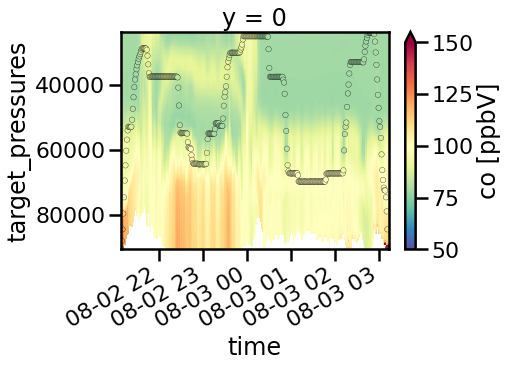

In [40]:
ax = ds_wrf_const['co'].squeeze().plot(x='time',y='target_pressures',vmin=50,vmax=150,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_wrf.time.values,df_wrf.pressure_obs.values,c=df_wrf['co'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 50, vmax = 150)

In [41]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_wrf['no2'],target_pressures,
                                      ds_wrf['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'no2'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')
ds_wrf_const

[########################################] | 100% Completed |  6.1s
[########################################] | 100% Completed |  6.2s
[########################################] | 100% Completed |  6.3s
[########################################] | 100% Completed |  6.3s
[########################################] | 100% Completed |  5.8s
[########################################] | 100% Completed |  5.9s
[########################################] | 100% Completed |  6.0s
[########################################] | 100% Completed |  6.1s


<xarray.Dataset>
Dimensions:           (x: 365, y: 1, z: 134)
Coordinates:
    time              (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T0...
    time_obs          (x) datetime64[ns] 2019-08-02T21:08:00 ... 2019-08-03T0...
  * x                 (x) int64 0 1 2 3 4 5 6 7 ... 358 359 360 361 362 363 364
  * y                 (y) int64 0
    pressure_obs      (y, x) float64 9.045e+04 8.808e+04 ... 8.454e+04 9.02e+04
    latitude          (y, x) float64 43.57 43.59 43.64 ... 43.6 43.55 43.55
    longitude         (y, x) float64 -116.2 -116.3 -116.3 ... -116.1 -116.2
    target_pressures  (z) float64 9.05e+04 9e+04 8.95e+04 ... 2.45e+04 2.4e+04
Dimensions without coordinates: z
Data variables:
    no2               (x, z, y) float64 nan 1.044 0.9976 ... 0.1064 0.1117

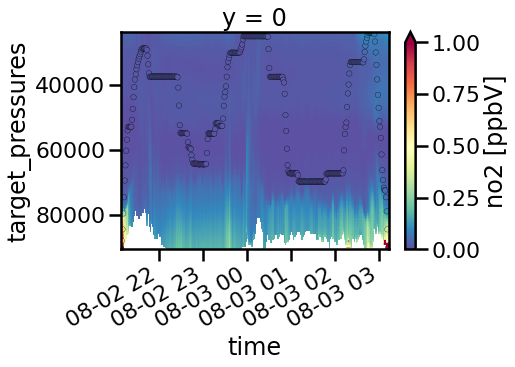

In [42]:
ax = ds_wrf_const['no2'].squeeze().plot(x='time',y='target_pressures',vmin=0,vmax=1,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_wrf.time.values,df_wrf.pressure_obs.values,c=df_wrf['no2'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 0, vmax = 1)

[########################################] | 100% Completed | 10.8s
[########################################] | 100% Completed | 10.9s
[########################################] | 100% Completed | 11.0s
[########################################] | 100% Completed | 11.1s
[########################################] | 100% Completed | 15.7s
[########################################] | 100% Completed | 15.8s
[########################################] | 100% Completed | 15.9s
[########################################] | 100% Completed | 15.9s


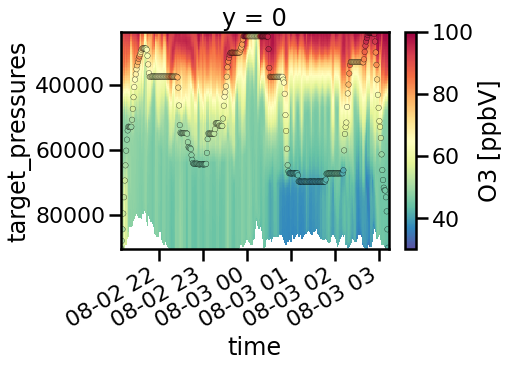

In [43]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_cmaq['O3'],target_pressures,
                                      ds_cmaq['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'O3'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')

ax = ds_wrf_const['O3'].squeeze().plot(x='time',y='target_pressures',vmin=30,vmax=100,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_cmaq.time.values,df_cmaq.pressure_obs.values,c=df_cmaq['O3'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 30, vmax = 100)

[########################################] | 100% Completed | 12.2s
[########################################] | 100% Completed | 12.2s
[########################################] | 100% Completed | 12.3s
[########################################] | 100% Completed | 12.4s
[########################################] | 100% Completed | 13.1s
[########################################] | 100% Completed | 13.2s
[########################################] | 100% Completed | 13.3s
[########################################] | 100% Completed | 13.4s


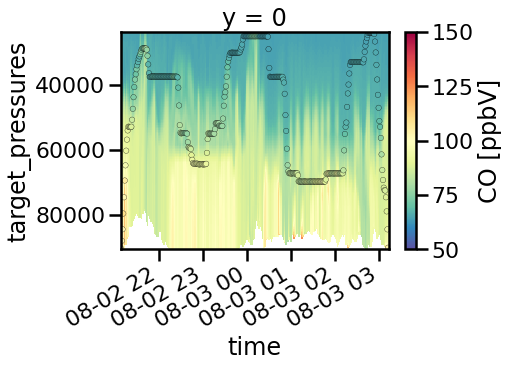

In [44]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_cmaq['CO'],target_pressures,
                                      ds_cmaq['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'CO'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')

ax = ds_wrf_const['CO'].squeeze().plot(x='time',y='target_pressures',vmin=50,vmax=150,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_cmaq.time.values,df_cmaq.pressure_obs.values,c=df_cmaq['CO'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 50, vmax = 150)

[########################################] | 100% Completed | 12.0s
[########################################] | 100% Completed | 12.0s
[########################################] | 100% Completed | 12.1s
[########################################] | 100% Completed | 12.2s
[########################################] | 100% Completed | 12.6s
[########################################] | 100% Completed | 12.7s
[########################################] | 100% Completed | 12.8s
[########################################] | 100% Completed | 12.9s


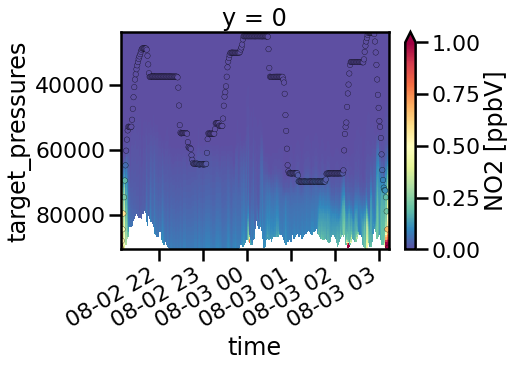

In [45]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_cmaq['NO2'],target_pressures,
                                      ds_cmaq['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'NO2'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')

ax = ds_wrf_const['NO2'].squeeze().plot(x='time',y='target_pressures',vmin=0,vmax=1,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_cmaq.time.values,df_cmaq.pressure_obs.values,c=df_cmaq['NO2'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 0, vmax = 1)

[########################################] | 100% Completed |  6.1s
[########################################] | 100% Completed |  6.2s
[########################################] | 100% Completed |  6.3s
[########################################] | 100% Completed |  6.4s
[########################################] | 100% Completed |  0.8s
[########################################] | 100% Completed |  0.9s
[########################################] | 100% Completed |  0.9s
[########################################] | 100% Completed |  1.0s


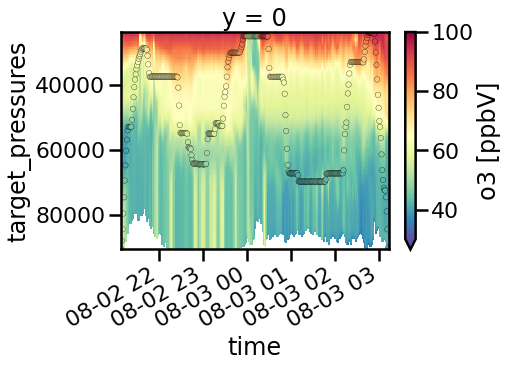

In [46]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_rrfs['o3'],target_pressures,
                                      ds_rrfs['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'o3'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')

ax = ds_wrf_const['o3'].squeeze().plot(x='time',y='target_pressures',vmin=30,vmax=100,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_cmaq.time.values,df_cmaq.pressure_obs.values,c=df_rrfs['o3'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 30, vmax = 100)

[########################################] | 100% Completed |  5.2s
[########################################] | 100% Completed |  5.3s
[########################################] | 100% Completed |  5.4s
[########################################] | 100% Completed |  5.5s
[########################################] | 100% Completed |  0.8s
[########################################] | 100% Completed |  0.9s
[########################################] | 100% Completed |  1.0s
[########################################] | 100% Completed |  1.0s


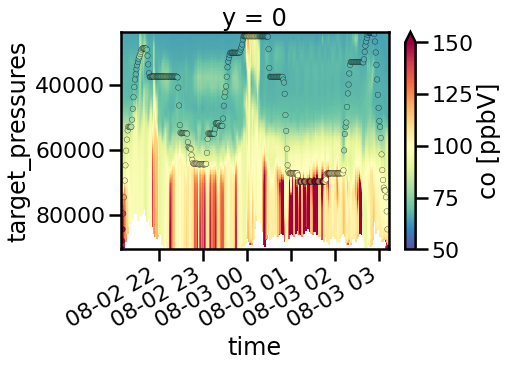

In [47]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_rrfs['co'],target_pressures,
                                      ds_rrfs['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'co'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')

ax = ds_wrf_const['co'].squeeze().plot(x='time',y='target_pressures',vmin=50,vmax=150,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_cmaq.time.values,df_cmaq.pressure_obs.values,c=df_rrfs['co'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 50, vmax = 150)

[########################################] | 100% Completed |  5.8s
[########################################] | 100% Completed |  5.9s
[########################################] | 100% Completed |  6.0s
[########################################] | 100% Completed |  6.1s
[########################################] | 100% Completed |  1.1s
[########################################] | 100% Completed |  1.2s
[########################################] | 100% Completed |  1.2s
[########################################] | 100% Completed |  1.2s


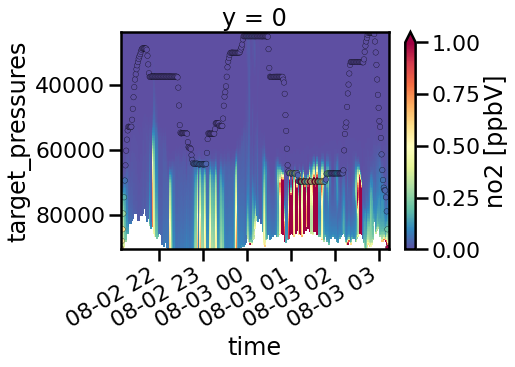

In [48]:
import numpy as np
import xarray as xr
#So let's to a vertical cross section along the flight tracks. 
#First you have to calculate the vertical direction.
target_pressures = np.linspace(90500,24000,134)
da_wrf_const = resample_stratify(ds_rrfs['no2'],target_pressures,
                                      ds_rrfs['pres_pa_mid'],axis=1,
                                      interpolation='linear',extrapolation='nan')
da_wrf_const.name = 'no2'
da_target_pressures = xr.DataArray(target_pressures, dims=('z'))
da_target_pressures.name = 'target_pressures'
ds_wrf_const = xr.merge([da_wrf_const,da_target_pressures])
ds_wrf_const = ds_wrf_const.set_coords('target_pressures')

ax = ds_wrf_const['no2'].squeeze().plot(x='time',y='target_pressures',vmin=0,vmax=1,
                                       yincrease=False,cmap='Spectral_r')
ax.axes.scatter(df_cmaq.time.values,df_cmaq.pressure_obs.values,c=df_rrfs['no2'],s=30.0,
                    edgecolor='black',linewidth=.3,
                    cmap='Spectral_r',
                    vmin = 0, vmax = 1)

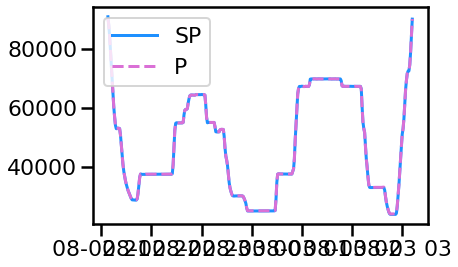

In [49]:
import matplotlib.pyplot as plt
plt.plot(df.index,df['Static_Pressure_YANG']*100,label='SP')
plt.plot(df.index,df['pressure_obs'],label='P',linestyle='--')
plt.legend()

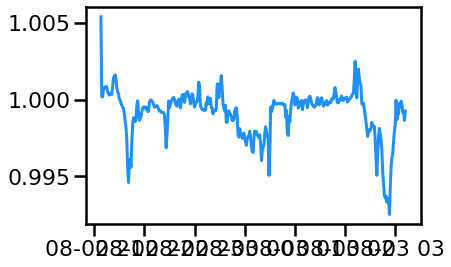

In [50]:
plt.plot(df.index,df['Static_Pressure_YANG']*100/df['pressure_obs'])
#Differences in pressure are less than 0.5% so could use either of these.